In [1]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib import gridspec

from distutils import util

from cycler import cycler

from scipy import optimize
import numpy as np
import os
import configparser
import sys
sys.path.append('../')
import time

import torch
import torch.nn as nn

from network import CycleSN
from training_fns import batch_to_cuda, create_synth_batch, CSNDataset
from analysis_fns import (apstarwavegrid, plot_spec_resid_density, tsne_domain_analysis2)

model_name = 'kurucz_to_apogee_1'

use_cuda = torch.cuda.is_available()
if use_cuda:
    print('Using GPU!')
    torch.set_default_tensor_type('torch.cuda.FloatTensor')
else:
    torch.set_default_tensor_type('torch.FloatTensor')
    
#-----------------------------------------------------------------------
import os
start_index = 0
torch.cuda.set_device(start_index)


Using GPU!


In [2]:
# define plot properties
import matplotlib.cm as cm

from matplotlib import rcParams
from matplotlib import rc
from mpl_toolkits.axes_grid1 import make_axes_locatable

def rgb(r,g,b):
    return (float(r)/256.,float(g)/256.,float(b)/256.)

cb2 = [rgb(31,120,180), rgb(255,127,0), rgb(51,160,44), rgb(227,26,28), \
       rgb(10,10,10), rgb(253,191,111), rgb(178,223,138), rgb(251,154,153)]

rcParams['figure.figsize'] = (11,7.5)
#rcParams['figure.dpi'] = 500

rcParams['lines.linewidth'] = 1

rcParams['axes.prop_cycle'] = cycler('color', cb2)
rcParams['axes.facecolor'] = 'white'
rcParams['axes.grid'] = False

rcParams['patch.facecolor'] = cb2[0]
rcParams['patch.edgecolor'] = 'white'

rcParams['font.family'] = 'Bitstream Vera Sans' 
rcParams['font.size'] = 25
rcParams['font.weight'] = 300

> Load the model configuration

In [3]:
# Directories
csn_dir = '..'
config_dir = os.path.join(csn_dir, 'configs/')
model_dir = os.path.join(csn_dir, 'models/')
data_dir = os.path.join(csn_dir, 'data/')

# Model configuration
config = configparser.ConfigParser()
config.read(config_dir+model_name+'.ini')
architecture_config = config['ARCHITECTURE']

print('\nCreating model: %s'%model_name)
print('\nConfiguration:')

for key_head in config.keys():
    if key_head=='DEFAULT':
        continue
    print('  %s' % key_head)
    for key in config[key_head].keys():
        print('    %s: %s'%(key, config[key_head][key]))
        
# DATA FILES
data_file_synth = os.path.join(data_dir, config['DATA']['data_file_synth'])
data_file_obs = os.path.join(data_dir, config['DATA']['data_file_obs'])
spectra_norm_file = os.path.join(data_dir, config['DATA']['spectra_norm_file'])
emulator_fn = os.path.join(model_dir, config['DATA']['emulator_fn'])


Creating model: kurucz_to_apogee_1

Configuration:
  DATA
    spectra_norm_file: mean_and_std_PAYNE_specs.npy
    data_file_synth: csn_kurucz.h5
    data_file_obs: csn_apogee.h5
    emulator_fn: PAYNE.pth.tar
  TRAINING
    batchsize: 8
    learning_rate_encoder: 0.0001
    learning_rate_decoder: 0.0001
    learning_rate_discriminator: 0.0001
    loss_weight_synth: 3
    loss_weight_obs: 9
    loss_weight_gen: 1
    loss_weight_dis: 1
    lr_decay_batch_iters_rg: [5e4,10e4,15e4,20e4,25e5]
    lr_decay_batch_iters_dis: [5e4,10e4,15e4,20e4,25e5]
    lr_decay_rg: 0.7
    lr_decay_dis: 0.7
    total_batch_iters: 5e5
    use_real_as_true: False
    mask_synth_lines: False
  ARCHITECTURE
    num_pixels: 7167
    activation: LeakyReLU
    conv_filts_ae_dom: [32, 64]
    conv_filt_lens_ae_dom: [7, 7]
    conv_strides_ae_dom: [4, 4]
    conv_filts_ae_sh: [128, 256, 512]
    conv_filt_lens_ae_sh: [7, 7, 7]
    conv_strides_ae_sh: [4, 2, 2]
    conv_filts_ae_sp: [32, 32, 32]
    conv_filt_lens_a

Construct the network architecture

In [4]:
# BUILD THE NETWORKS
print('\nBuilding networks...')
model = CycleSN(architecture_config, emulator_fn, use_cuda=use_cuda)


Building networks...


Load the pre-trained weights for the network

In [5]:
model_filename =  os.path.join(model_dir,model_name+'.pth.tar')
print('\nLoading saved model...')

# Load model info
checkpoint = torch.load(model_filename, map_location=lambda storage, loc: storage)
model.load_state_dict(checkpoint['cycle_model'])


Loading saved model...


<All keys matched successfully>

In [6]:
num_spec = 7000

# Normalization data for the spectra
x_mean, x_std = np.load(spectra_norm_file)
model.x_mean = x_mean
model.x_std = x_std

# Load ASPCAP wave-grid
wave_grid = apstarwavegrid()[47:]

# A set of observed spectra
obs_dataset = CSNDataset(data_file_obs, dataset='test', x_mean=x_mean, 
                             x_std=x_std, line_mask=None)
obs_batch = obs_dataset.__getitem__(np.arange(num_spec)) 

# Switch to GPU
if use_cuda:
    obs_batch = batch_to_cuda(obs_batch)

> Fit spectra.

In [ ]:
# insert results
results_filename =  os.path.join(data_dir,'results_' + str(start_index) + '.npy')
  
# restore previous results
popt1 = np.load("../popt_array_transferred_model.npy")
popt1 = torch.from_numpy(popt1[:,:25].astype("float32")).cuda()
    
    
#=======================================================================================
# assumes:
#  - weight ~ 1/sigma (and not 1/sigma**2)
def least_squares_fit(model, data, weight, params):
    loss_fn = torch.nn.MSELoss(reduction='mean')
    data *= weight
    
    params_found = False
    count_nans = 0
    orig_params = params.clone()
    
#----------------------------------------------------------------------------------------
    while params_found is False:
        optimizer = torch.optim.LBFGS([params], lr=0.01, max_iter=100,\
                                      line_search_fn='strong_wolfe')
        n_epochs = 10
        
#----------------------------------------------------------------------------------------
        for epoch in range(n_epochs):
            def closure():
                if torch.is_grad_enabled():
                    optimizer.zero_grad()
                fit = weight*model(params)
                loss = loss_fn(fit, data)
                if loss.requires_grad:
                    loss.backward()
                return loss
            optimizer.step(closure)
            min_loss = closure().item()
            
#----------------------------------------------------------------------------------------
        if np.isnan(min_loss):
            params.data = orig_params.data
            count_nans+=1
        else:
            params_found=True
        if count_nans>10:
            params.data = orig_params.data
            params_found=True
    return min_loss


#=======================================================================================
# define loss
mse = torch.nn.MSELoss(reduction='mean')
cp_start_time = time.time()

#----------------------------------------------------------------------------------------
# Loop over all spectra
for cur_indx in range(start_index*2500,start_index*2500+2500):
    print("Spectrum ", cur_indx)
    obs_batch = obs_dataset.__getitem__(cur_indx) 
    if use_cuda:
        obs_batch = batch_to_cuda(obs_batch)
        
#----------------------------------------------------------------------------------------
    # Create z_sp
    with torch.no_grad():
        zsh_obs, zsp_obs = model.obs_to_z(obs_batch['x'].unsqueeze(0))
    model.cur_z_sp = zsp_obs
    
    x_weight = obs_batch['x_msk'].unsqueeze(0)/obs_batch['x_err'].unsqueeze(0)

#----------------------------------------------------------------------------------------
    # initialize stellar parameters with ThePayne guess
    #y_payne = (obs_batch['y'].unsqueeze(0) - model.y_min) / (model.y_max - model.y_min) - 0.5
    y_payne = (popt1[cur_indx:cur_indx+1] - model.y_min) / (model.y_max - model.y_min) - 0.5
    
    # no initialization
    #y_payne = torch.from_numpy(np.zeros((1,25)).astype("float32")).cuda()
    
    params = torch.nn.Parameter(y_payne, requires_grad=True)
    print("  init loss full  : ", mse(x_weight*model.y_to_obs(params), obs_batch['x'].unsqueeze(0)*x_weight).item())
    loss_full = least_squares_fit(model.y_to_obs, obs_batch['x'].unsqueeze(0), x_weight, params)
    print("  final loss full : ", loss_full)
    y_pred = (params + 0.5) * (model.y_max - model.y_min) + model.y_min 
    
    if cur_indx==start_index*2500:
        y_preds = np.array(y_pred.data.cpu().numpy())
    else:
        y_preds = np.vstack((y_preds, y_pred.data.cpu().numpy()))
        
#----------------------------------------------------------------------------------------
    # Save every 15 minutes
    if time.time() - cp_start_time >= 15*60:
        np.save(results_filename, y_preds)
        cp_start_time = time.time()
        
np.save(results_filename, y_preds)


In [ ]:
y_preds = np.load("../data/results.npy")

> Calculate models.

In [7]:
# restore fit
# popt1 = np.load("../../popt_array_transferred_model_observed.npy")
# popt1 = torch.from_numpy(popt1[90000:97000][:,:25].astype("float32")).cuda()
# synth_batch = create_synth_batch(model, x_mean, x_std, popt1, 
#                                 line_mask=None, use_cuda=use_cuda)

popt1 = np.load("../popt_array_transferred_model_observed.npy")
y_preds = np.copy(popt1)[90000:97000]
popt1 = torch.from_numpy(popt1[90000:97000][:,:25].astype("float32")).cuda()
synth_batch = create_synth_batch(model, x_mean, x_std, popt1, 
                                 line_mask=None, use_cuda=use_cuda)

popt2 = np.load("../popt_array_no_mask.npy")
popt2 = torch.from_numpy(popt2[90000:97000][:,:25].astype("float32")).cuda()
x_synth = create_synth_batch(model, x_mean, x_std, popt2, 
                                line_mask=None, use_cuda=use_cuda)["x"].data.cpu().numpy()

#---------------------------------------------------------------------------------------
# Generate synth batch of matching spectra
# synth_batch = create_synth_batch(model, x_mean, x_std, torch.from_numpy(y_preds.astype("float32")).cuda(), 
#                                  line_mask=None, use_cuda=use_cuda)
#synth_batch = create_synth_batch(model, x_mean, x_std, obs_batch['y'], 
#                                 line_mask=None, use_cuda=use_cuda)

# Switch to GPU
if use_cuda:
    synth_batch = batch_to_cuda(synth_batch)
    
#--------------------------------------------------------------------------
# Evaluate validation set
model.eval_mode()
    
x_synthsynth_all = []
x_obsobs_all = []
x_synthobs_all = []
x_obssynth_all = []
x_synthobssynth_all = []
x_obssynthobs_all = []

zsh_synth_all = []
zsh_obs_all = []
zsh_synthobs_all = []
zsh_obssynth_all = []

#--------------------------------------------------------------------------
with torch.no_grad():
    
    # evaluate in batch
    #for i in range(1):
    for i in range(int(synth_batch['x'].shape[0]/100)):
        
        # Encoding
        zsh_synth = model.synth_to_z(synth_batch['x'][100*i:100*(i+1)])
        zsh_obs, zsp_obs = model.obs_to_z(obs_batch['x'][100*i:100*(i+1)])
        
        # Reconstruction
        x_synthsynth = model.z_to_synth(zsh_synth)
        x_obsobs = model.z_to_obs(zsh_obs, zsp_obs)

        # Cross-domain mapping    
        x_synthobs = model.z_to_obs(zsh_synth, zsp_obs)
        x_obssynth = model.z_to_synth(zsh_obs)

        # Cycle-Reconstruction
        zsh_obssynth = model.synth_to_z(x_obssynth)
        zsh_synthobs, zsp_synthobs = model.obs_to_z(x_synthobs)
        x_obssynthobs = model.z_to_obs(zsh_obssynth, zsp_obs)
        x_synthobssynth = model.z_to_synth(zsh_synthobs)
  
#--------------------------------------------------------------------------
        # store results
        x_synthsynth = x_synthsynth.data.cpu().numpy()
        x_obsobs = x_obsobs.data.cpu().numpy()
        x_synthobs = x_synthobs.data.cpu().numpy()
        x_obssynth = x_obssynth.data.cpu().numpy()
        x_synthobssynth = x_synthobssynth.data.cpu().numpy()
        x_obssynthobs = x_obssynthobs.data.cpu().numpy()
        
        zsh_synth = zsh_synth.data.cpu().numpy()
        zsh_obs = zsh_obs.data.cpu().numpy()
        zsh_synthobs = zsh_synthobs.data.cpu().numpy()
        zsh_obssynth = zsh_obssynth.data.cpu().numpy()
        
        x_synthsynth_all.append(x_synthsynth*x_std + x_mean)
        x_obsobs_all.append(x_obsobs*x_std + x_mean)
        x_synthobs_all.append(x_synthobs*x_std + x_mean)
        x_obssynth_all.append(x_obssynth*x_std + x_mean)
        x_synthobssynth_all.append(x_synthobssynth*x_std + x_mean)
        x_obssynthobs_all.append(x_obssynthobs*x_std + x_mean)

        zsh_synth_all.append(zsh_synth)
        zsh_obs_all.append(zsh_obs)
        zsh_synthobs_all.append(zsh_synthobs)
        zsh_obssynth_all.append(zsh_obssynth)
        
#--------------------------------------------------------------------------
# save as training set for The Payne
# np.savez("training_spectra.npz",\
#          spectra = np.array(x_synthobs_all).reshape(synth_batch['x'].shape),\
#          labels = obs_batch['y'].data.cpu().numpy(),\
#          spectra_obs = obs_batch['x'].data.cpu().numpy(),\
#          spectra_obs_err = obs_batch['x_err'].data.cpu().numpy() - 1.)


In [8]:
# Return to numpy
#x_synth = synth_batch['x'].data.cpu().numpy()
x_obs = obs_batch['x'].data.cpu().numpy()
y_obs = obs_batch['y'].data.cpu().numpy()

#choose = y_obs[:,1] < 10.
choose = np.isfinite(y_preds[:,1]) 

x_obs_msk = obs_batch['x_msk'].data.cpu().numpy()[choose,:]
x_obs_err = (obs_batch['x_err'].data.cpu().numpy()[choose,:]*x_std)

x_synthsynth_all = np.array(x_synthsynth_all).reshape(x_synth.shape)[choose,:]
x_obsobs_all = np.array(x_obsobs_all).reshape(x_synth.shape)[choose,:]
x_synthobs_all = np.array(x_synthobs_all).reshape(x_synth.shape)[choose,:]
x_obssynth_all = np.array(x_obssynth_all).reshape(x_synth.shape)[choose,:]
x_synthobssynth_all = np.array(x_synthobssynth_all).reshape(x_synth.shape)[choose,:]
x_obssynthobs_all = np.array(x_obssynthobs_all).reshape(x_synth.shape)[choose,:]

num_zsh1, num_zsh2 = zsh_synth_all[0].shape[1], zsh_synth_all[0].shape[2]
zsh_synth_all = np.array(zsh_synth_all).reshape((num_spec,num_zsh1,num_zsh2))[choose,:,:]
zsh_obs_all = np.array(zsh_obs_all).reshape((num_spec,num_zsh1,num_zsh2))[choose,:,:]
zsh_synthobs_all = np.array(zsh_synthobs_all).reshape((num_spec,num_zsh1,num_zsh2))[choose,:,:]
zsh_obssynth_all = np.array(zsh_obssynth_all).reshape((num_spec,num_zsh1,num_zsh2))[choose,:,:]

# Denormalize
x_synth = x_synth[choose,:]*x_std + x_mean
x_obs = x_obs[choose,:]*x_std + x_mean
y_obs = y_obs[choose,:]
y_preds = y_preds[choose,:]

# save results
# np.savez("temp.npz",\
#          wave_grid = wave_grid,\
#          x_obs_msk = x_obs_msk,\
#          x_obs_err = x_obs_err,\
#          x_synthsynth_all = x_synthsynth_all,\
#          x_obsobs_all = x_obsobs_all,\
#          x_synthobs_all = x_synthobs_all,\
#          x_obssynth_all = x_obssynth_all,\
#          x_synthobssynth_all = x_synthobssynth_all,\
#          x_obssynthobs_all = x_obssynthobs_all,\
#          x_synth = x_synth,\
#          x_obs = x_obs)

In [9]:
# temp = np.load("temp.npz")
# wave_grid = temp["wave_grid"]
# x_obs_msk = temp["x_obs_msk"]
# x_obs_err = temp["x_obs_err"]
# x_synthsynth_all = temp["x_synthsynth_all"]
# x_obsobs_all = temp["x_obsobs_all"]
# x_synthobs_all = temp["x_synthobs_all"]
# x_obssynth_all = temp["x_obssynth_all"]
# x_synthobssynth_all = temp["x_synthobssynth_all"]
# x_obssynthobs_all = temp["x_obssynthobs_all"]
# x_synth = temp["x_synth"]
# x_obs = temp["x_obs"]
# print(x_synth.shape)


> Plot single spectrum comparison.

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


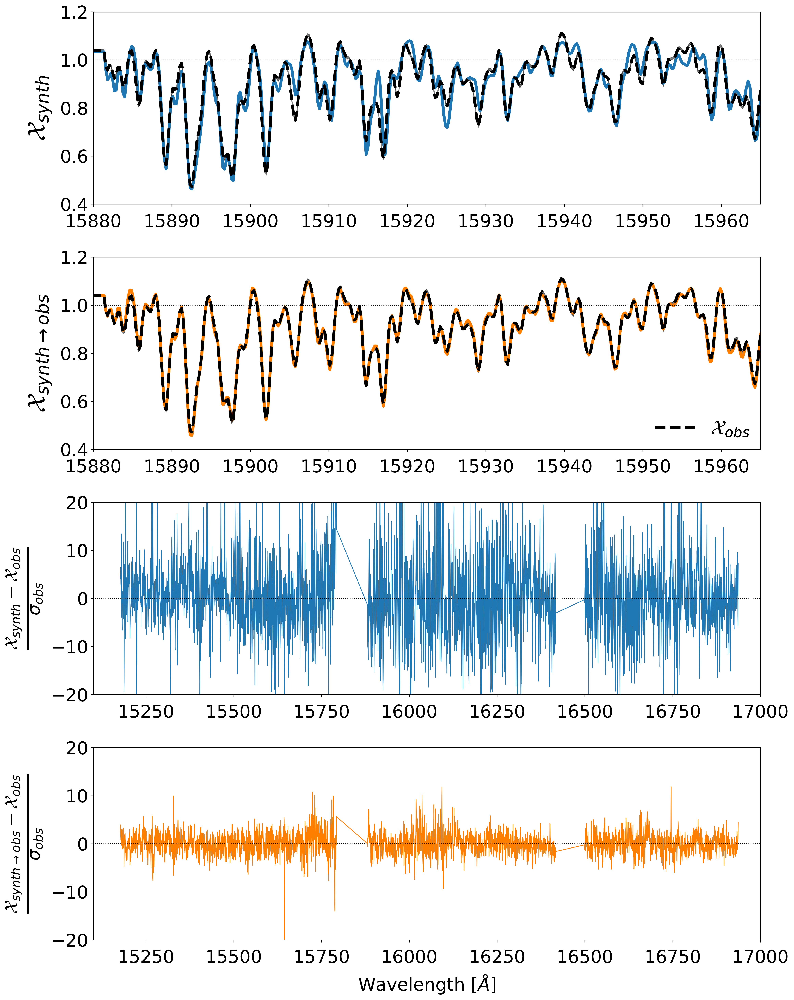

In [10]:
# choose a K-giant
# choose = np.where((np.abs(y_obs[:,0]-4750)< 100)\
#                   *(np.abs(y_obs[:,1]-2.5)< 0.2)\
#                   *(np.abs(y_obs[:,18]-0.0)< 0.2)\
#                   *(1./np.median(x_obs_err, axis=1)<100) == 1)[0][0]
# choose a K-giant
choose = np.where((np.abs(y_obs[:,0]-3300)< 50)\
                  *(np.abs(y_obs[:,1]-0.5)< 0.1)\
                  *(np.abs(y_obs[:,18]-0.0)< 0.1)\
                   == 1)[0][0]


#====================================================================================================
# initiate the plot
fig = plt.figure(figsize=[16,20]);

# combine labels
ax = fig.add_subplot(111)

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top='off', bottom='off', left='off', right='off')


#====================================================================================================
# initiate plot
ax = plt.subplot(411)
ax = fig.gca();

# axis labels
ax.set_ylabel(r'$\mathcal{X}_{synth}$', fontsize=35, labelpad=10);

# set range
plt.xlim([15880,15965])
plt.ylim([0.4,1.2])

# add padding
ax.tick_params(axis='x', pad=10);

# plot spectrum
plt.plot(wave_grid, x_synth[choose], c=cb2[0], lw=4)
#plt.plot(wave_grid, x_synth[choose], c=((256-251)/256.,(256-154)/256.,(256-153)/256.,1.) ,lw=4)
plt.plot(wave_grid, x_obs[choose], color="black", lw=4, ls="--")
plt.fill_between(wave_grid, x_obs[choose]-x_obs_err[choose], x_obs[choose]+x_obs_err[choose],\
                 color="black", alpha=0.5)
plt.plot([15880,15970],[1,1], color="black", ls=":")

#------------------------------------------------------------------------------------------------------
# initiate plot
ax = plt.subplot(412)
ax = fig.gca();

# axis labels
ax.set_ylabel(r'$\mathcal{X}_{synth\rightarrow obs}$', fontsize=35, labelpad=10);

# set range
plt.xlim([15880,15965])
plt.ylim([0.4,1.2])

# add padding
ax.tick_params(axis='x', pad=10);

# plot spectrum
plt.plot(wave_grid, x_synthobs_all[choose], c=cb2[1], lw=4)
#plt.plot(wave_grid, x_synthobs_all[choose], c=((256-166)/256.,(256-206)/256.,(256-227)/256.,1.) ,lw=4)
plt.plot(wave_grid, x_obs[choose], color="black", lw=4, ls="--", label=r'$\mathcal{X}_{obs}$')
plt.fill_between(wave_grid, x_obs[choose]-x_obs_err[choose], x_obs[choose]+x_obs_err[choose],\
                 color="black", alpha=0.5)

plt.plot([15880,15970],[1,1], color="black", ls=":")

# add legend         
plt.legend(loc="lower right", fontsize=28, frameon=False,\
            borderpad=0.05, labelspacing=0.1)


#------------------------------------------------------------------------------------------------------
# initiate plot
ax = plt.subplot(413)
ax = fig.gca();

# axis labels
ax.set_ylabel(r'$\frac{\mathcal{X}_{synth} - \mathcal{X}_{obs}}{\sigma_{obs}}$', fontsize=35, labelpad=10);

# set range
plt.xlim([15100,17000])
plt.ylim([-20.,20.])

# add padding
ax.tick_params(axis='x', pad=10);
#plt.setp(ax.get_xticklabels(), visible=False)

# plot spectrum
plt.plot(wave_grid, (x_synth[choose]-x_obs[choose])/x_obs_err[choose],\
         color=cb2[0], lw=1, label=r'$\mathcal{X}_{obs}$')
plt.plot([15100,17000],[0,0], color="black", ls=":")

#------------------------------------------------------------------------------------------------------
# initiate plot
ax = plt.subplot(414)
ax = fig.gca();

# axis labels
ax.set_xlabel("Wavelength [$\AA$]", fontsize=25, labelpad=10);
ax.set_ylabel(r'$\frac{\mathcal{X}_{synth \rightarrow obs} - \mathcal{X}_{obs}}{\sigma_{obs}}$', fontsize=35, labelpad=10);

# set range
plt.xlim([15100,17000])
plt.ylim([-20.,20.])

# add padding
ax.tick_params(axis='x', pad=10);

# plot spectrum
plt.plot(wave_grid, (x_synthobs_all[choose]-x_obs[choose])/x_obs_err[choose],\
         color=cb2[1], lw=1, label=r'$\mathcal{X}_{obs}$')
plt.plot([15100,17000],[0,0], color="black", ls=":")


#------------------------------------------------------------------------------------------------------
# save figure
plt.tight_layout()
plt.savefig("fig7.png")



> Make comparison plot.

In [11]:
#resid = ((x_obsobs_all-x_obs)/x_obs_err).ravel()
resid = (x_obssynthobs_all-x_obs)/x_obs_err
print(np.sum(np.abs(resid) > 3)/float(resid.ravel().size))

0.032543514415528385


findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


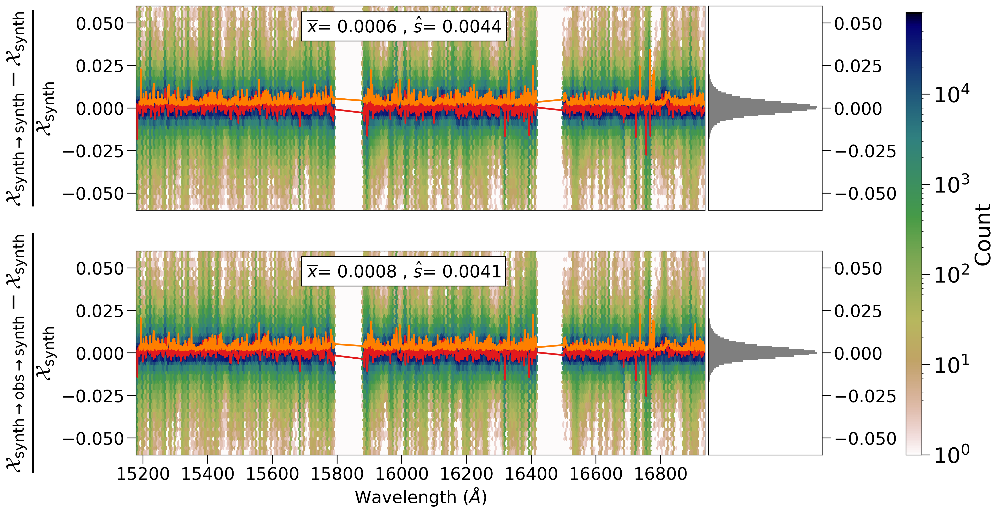

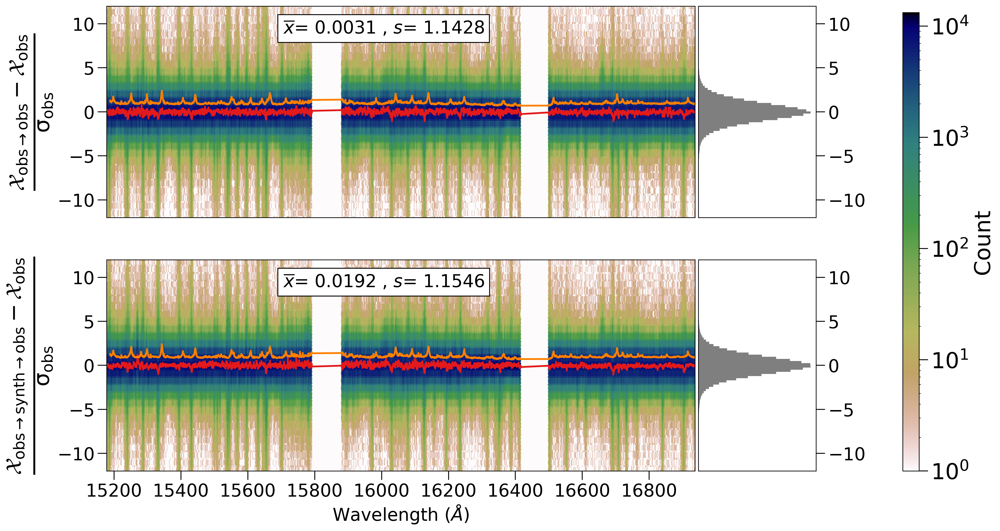

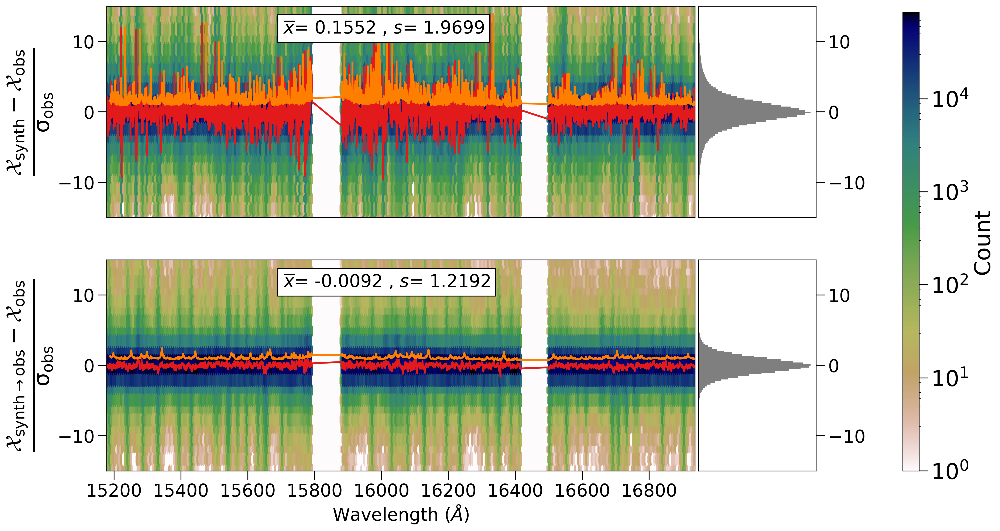

In [12]:
# # synthetic domain
resid = [(x_synthsynth_all-x_synth)/x_synth,
         (x_synthobssynth_all-x_synth)/x_synth]

plot_spec_resid_density(wave_grid, resid, x_obs_msk,
                        labels=[r'$\mathregular{\frac{\mathcal{X}_{synth\rightarrow synth} - \mathcal{X}_{synth}}{\mathcal{X}_{synth}}}$',
                                r'$\mathregular{\frac{\mathcal{X}_{synth\rightarrow obs \rightarrow synth} - \mathcal{X}_{synth}}{\mathcal{X}_{synth}}}$'], 
                        ylim=(-0.06,0.06), hist=True, kde=False,
                        dist_bins=1000, hex_grid=300, bias='mean', scatter='1sigma',\
                        bias_label='$\overline{x}$',
                        scatter_label=', $\hat{s}$',
                        cmap="gist_earth_r", savename="fig5.png")

#-------------------------------------------------------------------------------------------------
# observed domain
resid = [(x_obsobs_all-x_obs)/x_obs_err,
         (x_obssynthobs_all-x_obs)/x_obs_err]

plot_spec_resid_density(wave_grid, resid, x_obs_msk,
                        labels=[r'$\mathregular{\frac{\mathcal{X}_{obs\rightarrow obs} - \mathcal{X}_{obs}}{\sigma_{obs}}}$',
                                r'$\mathregular{\frac{\mathcal{X}_{obs\rightarrow synth \rightarrow obs} - \mathcal{X}_{obs}}{\sigma_{obs}}}$'], 
                        ylim=(-12,12), hist=True, kde=False,
                        dist_bins=2000, hex_grid=1000, bias='mean', scatter='1sigma',\
                        bias_label='$\overline{x}$',
                        scatter_label=', $s$',
                        cmap="gist_earth_r", savename="fig6.png")

#-------------------------------------------------------------------------------------------------
# transfered domain
resid = [(x_synth-x_obs)/x_obs_err, 
         (x_synthobs_all-x_obs)/x_obs_err]

plot_spec_resid_density(wave_grid, resid, x_obs_msk,
                        labels=[r'$\mathregular{\frac{\mathcal{X}_{synth} - \mathcal{X}_{obs}}{\sigma_{obs}}}$',
                                r'$\mathregular{\frac{\mathcal{X}_{synth\rightarrow obs} - \mathcal{X}_{obs}}{\sigma_{obs}}}$'], 
                        ylim=(-15,15), hist=True, kde=False,
                        dist_bins=2000, hex_grid=300, bias='mean', scatter='1sigma',\
                        bias_label='$\overline{x}$',
                        scatter_label=', $s$',
                        cmap="gist_earth_r", savename="fig8.png")

In [ ]:
# save results
x_synth_residual = (x_synth-x_obs)/x_obs_err
x_synthobs_residual = (x_synthobs_all-x_obs)/x_obs_err

np.savez("residual.npz",\
         x_synth_residual = x_synth_residual,\
         x_synthobs_residual = x_synthobs_residual,\
         y_synthobs = y_obs,\
         y_synth = y_preds)

> Make tSNE plot.

In [ ]:
tsne_domain_analysis2(x_synth, x_obsobs_all, x_synthobs_all,
                      zsh_synth=zsh_synth_all, zsh_obs=zsh_obs_all,
                      x_obs_label=r'$\mathcal{X}_{obs\rightarrow obs}$',
                      savename='fig10.png')

> Convert observed data to the synthetic space to fit wit The Payne.

In [ ]:
# Normalization data for the spectra
x_mean, x_std = np.load(spectra_norm_file)
temp = np.load("../../cycle_gan_apogee_25D.npz")
obs_batch = (temp["apogee_spectra"][:,47:] - x_mean)/x_std
obs_batch = torch.from_numpy(obs_batch.astype(np.float32)).cuda()

# initiate array
x_obssynth_all = np.zeros((obs_batch.shape[0],7214-47))

# transfer model to the synthetic domain
model.eval_mode()

with torch.no_grad():
    for i in range(int(obs_batch.shape[0]/1000)):
        zsh_obs, zsp_obs = model.obs_to_z(obs_batch[1000*i:1000*(i+1)])   
        x_obssynth = model.z_to_synth(zsh_obs)
        x_obssynth = x_obssynth.data.cpu().numpy()
        x_obssynth_all[1000*i:1000*(i+1),:] = (x_obssynth*x_std + x_mean)
    i += 1
    zsh_obs, zsp_obs = model.obs_to_z(obs_batch[1000*i:])   
    x_obssynth = model.z_to_synth(zsh_obs)
    x_obssynth = x_obssynth.data.cpu().numpy()
    x_obssynth_all[1000*i:,:] = x_obssynth*x_std + x_mean
    

In [ ]:
np.savez("../../cycle_gan_apogee_25D_obssynth.npz",\
         apogee_labels = temp["apogee_labels"],\
         apogee_spectra = x_obssynth_all)

## Fit labels.